In [1]:
#install.packages("igraph")
# load tide verse lirary to clean datframe first then load igraph when ready to create graph
library(tidyverse)

-- Attaching packages ------------------------------------------------------------------------------- tidyverse 1.3.1 --

v ggplot2 3.3.5     v purrr   0.3.4
v tibble  3.1.4     v dplyr   1.0.7
v tidyr   1.1.4     v stringr 1.4.0
v readr   2.0.2     v forcats 0.5.1

-- Conflicts ---------------------------------------------------------------------------------- tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()



In [2]:
data=read.csv('Top250-football-transfers.csv',header=TRUE, check.names=FALSE)

In [3]:
data

Name,Position,Age,Team_from,League_from,Team_to,League_to,Season,Market_value,Transfer_fee
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>
LuÃ­s Figo,Right Winger,27,FC Barcelona,LaLiga,Real Madrid,LaLiga,2000-2001,NA,60000000
HernÃ¡n Crespo,Centre-Forward,25,Parma,Serie A,Lazio,Serie A,2000-2001,NA,56810000
Marc Overmars,Left Winger,27,Arsenal,Premier League,FC Barcelona,LaLiga,2000-2001,NA,40000000
Gabriel Batistuta,Centre-Forward,31,Fiorentina,Serie A,AS Roma,Serie A,2000-2001,NA,36150000
Nicolas Anelka,Centre-Forward,21,Real Madrid,LaLiga,Paris SG,Ligue 1,2000-2001,NA,34500000
Rio Ferdinand,Centre-Back,22,West Ham,Premier League,Leeds,Premier League,2000-2001,NA,26000000
FlÃ¡vio Conceicao,Central Midfield,26,Dep. La CoruÃ±a,LaLiga,Real Madrid,LaLiga,2000-2001,NA,25000000
Savo Milosevic,Centre-Forward,26,Real Zaragoza,LaLiga,Parma,Serie A,2000-2001,NA,25000000
David TrÃ©zÃ©guet,Centre-Forward,22,Monaco,Ligue 1,Juventus,Serie A,2000-2001,NA,23240000


In [4]:
# check non empty market value column data
length(data$Market_value)

[1] 4700

# Approach 1 : simple edge weight and sum of total transfer between two clubs  

# Node list:::
 
 This will be all the unique clubs in the data frame
 
 Its sole attribute will be its "leagues name"
 
 Also generate a unique id no column to describe each node 

In [5]:
sources <- data %>% 
  distinct(Team_from) %>%
  rename(label = Team_from)

destinations <- data %>%
  distinct(Team_to) %>%
  rename(label = Team_to)

In [6]:
nodes <- full_join(sources, destinations, by = "label") %>% rowid_to_column("id")
nodes[1:5,]
length(nodes$label) #thus there exist 615 distinct nodes in the the graph

,id,label
,<int>,<chr>
1,1,FC Barcelona
2,2,Parma
3,3,Arsenal
4,4,Fiorentina
5,5,Real Madrid


[1] 615

# Generate Edge List

Lets see if multiple transer has occur bettween two clubs and store that value in a column called weigh

In [7]:
per_trans <- data %>%  
  group_by(Team_from, Team_to) %>%
  summarise(total_t_fee = sum(Transfer_fee),weight = n()) %>%
  ungroup()
per_trans[1:5,]

# with this information we can plot a graph for the total trasnfer made between teams from year 2000-2018

`summarise()` has grouped output by 'Team_from'. You can override using the `.groups` argument.



Team_from,Team_to,total_t_fee,weight
<chr>,<chr>,<int>,<int>
1. FC KÃ¶ln,1.FC K'lautern,1000000,1
1. FC KÃ¶ln,Arsenal,15000000,1
1. FC KÃ¶ln,Bay. Leverkusen,4100000,2
1. FC KÃ¶ln,Bayern Munich,10000000,1
1. FC KÃ¶ln,Spurs,6000000,1


In [8]:
#We can test and see if out weight and total fee btw clubs is true like so:
data_frame_mod <- data[data$Team_from=='1. FC KÃ¶ln',]
data_frame_mod

,Name,Position,Age,Team_from,League_from,Team_to,League_to,Season,Market_value,Transfer_fee
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>
227,Pascal Ojigwe,Defensive Midfield,23,1. FC KÃ¶ln,1.Bundesliga,Bay. Leverkusen,1.Bundesliga,2000-2001,NA,2100000
646,Hanno Balitsch,Defensive Midfield,21,1. FC KÃ¶ln,2.Bundesliga,Bay. Leverkusen,1.Bundesliga,2002-2003,NA,2000000
720,Christian Timm,Right Winger,23,1. FC KÃ¶ln,2.Bundesliga,1.FC K'lautern,1.Bundesliga,2002-2003,NA,1000000
1511,Lukas Podolski,Centre-Forward,21,1. FC KÃ¶ln,2.Bundesliga,Bayern Munich,1.Bundesliga,2006-2007,12000000,10000000
2997,Lukas Podolski,Centre-Forward,27,1. FC KÃ¶ln,2.Bundesliga,Arsenal,Premier League,2012-2013,20000000,15000000
3947,Kevin Wimmer,Centre-Back,22,1. FC KÃ¶ln,1.Bundesliga,Spurs,Premier League,2015-2016,7500000,6000000
4073,Yannick Gerhardt,Left-Back,22,1. FC KÃ¶ln,1.Bundesliga,VfL Wolfsburg,1.Bundesliga,2016-2017,4500000,13000000
4479,Anthony Modeste,Centre-Forward,30,1. FC KÃ¶ln,2.Bundesliga,TJ Quanjian,Super League,2018-2019,16000000,29000000
4635,Leonardo Bittencourt,Left Winger,24,1. FC KÃ¶ln,2.Bundesliga,TSG Hoffenheim,1.Bundesliga,2018-2019,6000000,6000000


In [9]:
# cross reference the sum and table data
data_frame_mod <- per_trans[per_trans$Team_from=='1. FC KÃ¶ln',]
data_frame_mod

Team_from,Team_to,total_t_fee,weight
<chr>,<chr>,<int>,<int>
1. FC KÃ¶ln,1.FC K'lautern,1000000,1
1. FC KÃ¶ln,Arsenal,15000000,1
1. FC KÃ¶ln,Bay. Leverkusen,4100000,2
1. FC KÃ¶ln,Bayern Munich,10000000,1
1. FC KÃ¶ln,Spurs,6000000,1
1. FC KÃ¶ln,TJ Quanjian,29000000,1
1. FC KÃ¶ln,TSG Hoffenheim,6000000,1
1. FC KÃ¶ln,VfL Wolfsburg,13000000,1
1. FC KÃ¶ln,Werder Bremen,4500000,1


In [10]:
edges <- per_trans %>% 
  left_join(nodes, by = c("Team_from" = "label")) %>% 
  rename(from = id)

edges <- edges %>% 
  left_join(nodes, by = c("Team_to" = "label")) %>% 
  rename(to = id)

In [11]:
edges[1:5,]


Team_from,Team_to,total_t_fee,weight,from,to
<chr>,<chr>,<int>,<int>,<int>,<int>
1. FC KÃ¶ln,1.FC K'lautern,1000000,1,138,134
1. FC KÃ¶ln,Arsenal,15000000,1,138,3
1. FC KÃ¶ln,Bay. Leverkusen,4100000,2,138,18
1. FC KÃ¶ln,Bayern Munich,10000000,1,138,176
1. FC KÃ¶ln,Spurs,6000000,1,138,145


In [12]:
edges <- select(edges, from, to, weight, total_t_fee)
edges[1:5,]

from,to,weight,total_t_fee
<int>,<int>,<int>,<int>
138,134,1,1000000
138,3,1,15000000
138,18,2,4100000
138,176,1,10000000
138,145,1,6000000


In [13]:
library('igraph')       # Now import igraph

Warning message:
"package 'igraph' was built under R version 4.1.2"

Attaching package: 'igraph'


The following objects are masked from 'package:dplyr':

    as_data_frame, groups, union


The following objects are masked from 'package:purrr':

    compose, simplify


The following object is masked from 'package:tidyr':

    crossing


The following object is masked from 'package:tibble':

    as_data_frame


The following objects are masked from 'package:stats':

    decompose, spectrum


The following object is masked from 'package:base':

    union




In [14]:
Ftg <- graph_from_data_frame(d = edges, vertices = nodes, directed = TRUE)

In [15]:
Ftg

IGRAPH 7e2f7f0 DNW- 615 3710 -- 
+ attr: name (v/c), label (v/c), weight (e/n), total_t_fee (e/n)
+ edges from 7e2f7f0 (vertex names):
 [1] 138->134 138->3   138->18  138->176 138->145 138->604 138->473 138->189
 [9] 138->175 134->138 134->176 134->96  134->175 212->18  212->95  212->149
[17] 212->246 212->245 212->189 263->138 263->545 263->18  263->149 263->99 
[25] 263->96  263->246 263->47  263->58  263->189 263->175 252->18  252->176
[33] 252->96  252->189 115->244 115->50  115->177 390->269 240->85  481->106
[41] 397->543 397->19  397->37  397->15  75 ->35  75 ->111 75 ->34  75 ->160
[49] 75 ->11  75 ->25  75 ->71  75 ->17  75 ->43  75 ->19  75 ->255 75 ->172
[57] 75 ->7   75 ->99  75 ->4   75 ->162 75 ->23  75 ->360 75 ->21  75 ->55 
+ ... omitted several edges

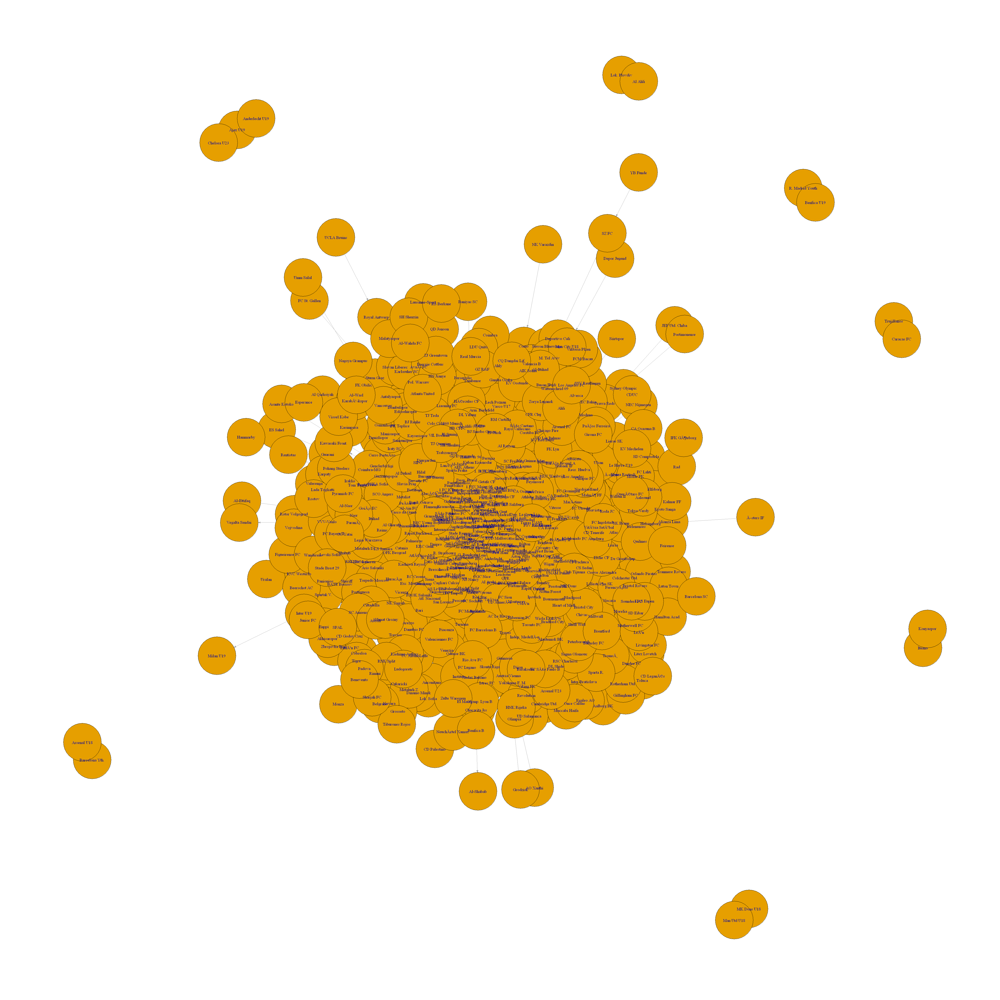

In [16]:
options(repr.plot.width=40, repr.plot.height=40) # this resizes the plot area (default = 7 by 7)
plot(Ftg, layout = layout.auto, vertex.size=9,edge.arrow.size = 0.05)


# Question: 
# Plot node size by 'degree out' attribute  i.e total no of players sold (transfer out)

# Plot node size by 'degree in' attribute  i.e total no of players bought (transfer in)

#plot using total transfer cost made (from) per club

#plot using total transfer cost spent (to) per club

In [17]:
#E(Ftg)[[]]

In [18]:
print(paste0("Ftg has ",gsize(Ftg)," edges"))
print(paste0("The total weight of the Ftg graph's edges is ",sum(strength(Ftg, mode = "in")),"."))

[1] "Ftg has 3710 edges"
[1] "The total weight of the Ftg graph's edges is 4700."


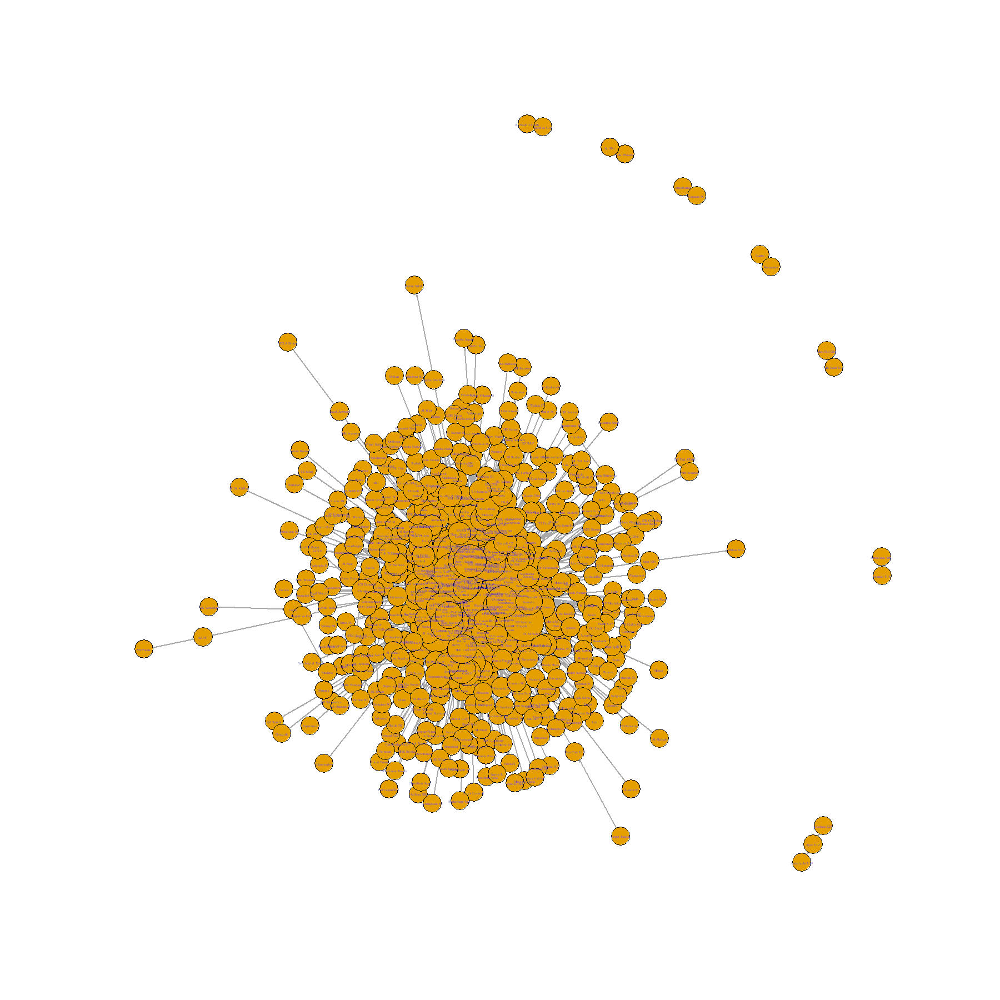

In [19]:
# plot graph with respect to node with largest degree   XXXX

options(repr.plot.width=15, repr.plot.height=15) # this resizes the plot area (default = 7 by 7)

V(Ftg)$size=5+15/diff(range(degree(Ftg)))*degree(Ftg)
plot.igraph(Ftg, vertex.label.cex = 0.3, layout = layout.auto, edge.width = 2,edge.arrow.size = 0.05)
#E(Ftg)$weight

In [20]:
#V(Ftg)[[]]

<h3> (i) Plot a graph using node size to indicate clubs with largest no transfers-IN (i.e Total no of player purchase)</h3>

To do this first seperate the data into subsets by weight

or alternatively, attempt it without spliting by weight

In [21]:
edges[1:2,]

from,to,weight,total_t_fee
<int>,<int>,<int>,<int>
138,134,1,1000000
138,3,1,15000000


In [22]:
# create subset of data for edges using weight class which is the number of transactions between two clubs

# create subset of data for edges with weight =1  i.e only single transfer between clubs
Tfr_w1 <- subset(edges, edges$weight == 1)
Tfr_gra1 <- graph_from_data_frame(d = Tfr_w1, vertices = nodes, directed = TRUE)

#Tfr_gra1 <- Tfr_gra1 %>% set_edge_attr("weight", value = Tfr_w1[,3]) %>% set_edge_attr("total_t_fee", value = Tfr_w1[,4])
#V(Tfr_gra1)[[]]
#E(Tfr_gra1)[[]]

# create subset of data for edges with weight =2  i.e 2 transfer btw clubs 
Tfr_w2 <- subset(edges, edges$weight ==2)
Tfr_gra2 <- graph_from_data_frame(d = Tfr_w2, vertices = nodes, directed = TRUE)

# create subset of data for edges with weight 3 & above i.e more than 2 transfer btw clubs
Tfr_w3 <- subset(edges, edges$weight >2)
Tfr_gra3 <- graph_from_data_frame(d = Tfr_w3, vertices = nodes, directed = TRUE)


In [23]:
Tfr_gra1

IGRAPH 82c2267 DNW- 615 3033 -- 
+ attr: name (v/c), label (v/c), weight (e/n), total_t_fee (e/n)
+ edges from 82c2267 (vertex names):
 [1] 138->134 138->3   138->176 138->145 138->604 138->473 138->189 138->175
 [9] 134->138 134->176 134->175 212->95  212->149 212->246 212->245 263->138
[17] 263->545 263->18  263->246 263->47  263->58  263->189 263->175 252->18 
[25] 252->176 252->96  252->189 115->244 115->50  115->177 390->269 240->85 
[33] 481->106 397->543 397->19  397->37  397->15  75 ->35  75 ->34  75 ->160
[41] 75 ->25  75 ->71  75 ->17  75 ->43  75 ->19  75 ->255 75 ->172 75 ->7  
[49] 75 ->4   75 ->162 75 ->23  75 ->26  75 ->58  75 ->27  75 ->5   75 ->8  
[57] 75 ->186 75 ->451 75 ->10  75 ->364 75 ->359 426->25  426->360 35 ->3  
+ ... omitted several edges

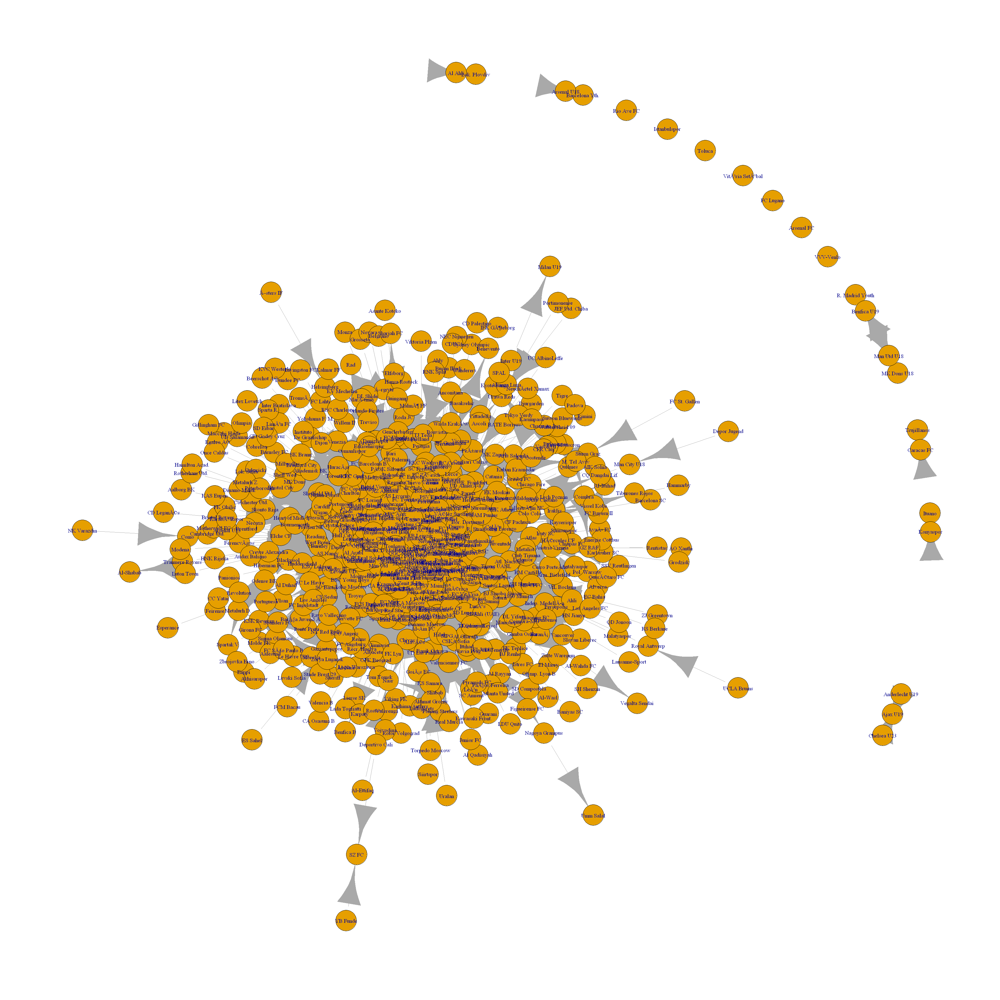

In [24]:
options(repr.plot.width=30, repr.plot.height=30) # this resizes the plot area (default = 7 by 7)
new_layout <- layout_nicely(Tfr_gra1)
plot(Tfr_gra1, layout = new_layout, vertex.size = 5)

In [25]:
mean(degree(Tfr_gra1))

# if graph is too big try removing nodes less than mean degree

[1] 9.863415

In [29]:
# find and remove nodes with 0 degrees for the given subset
disconnected.nodes = which(degree(Tfr_gra1)==0) # finds which nodes have degree = 0
nds_Tfr_gra1 <- delete.vertices(Tfr_gra1, disconnected.nodes) # removes the degree = 0 nodes

options(repr.plot.width=30, repr.plot.height=30)
new_layout <- layout_on_grid(nds_Tfr_gra1)
#plot(nds_Tfr_gra1, layout = new_layout, vertex.size = 8, vertex.label.cex = 1.6, 
#     edge.color = "black", vertex.color = "orange", edge.width = 2,edge.arrow.size = 0.2)

In [30]:
#degree(nds_Tfr_gra1)
#V(nds_Tfr_gra1)[[]]

[1] "layout_nicely"
[1] "layout_on_grid"
[1] "layout_on_sphere"
[1] "layout_randomly"
[1] "layout_with_fr"


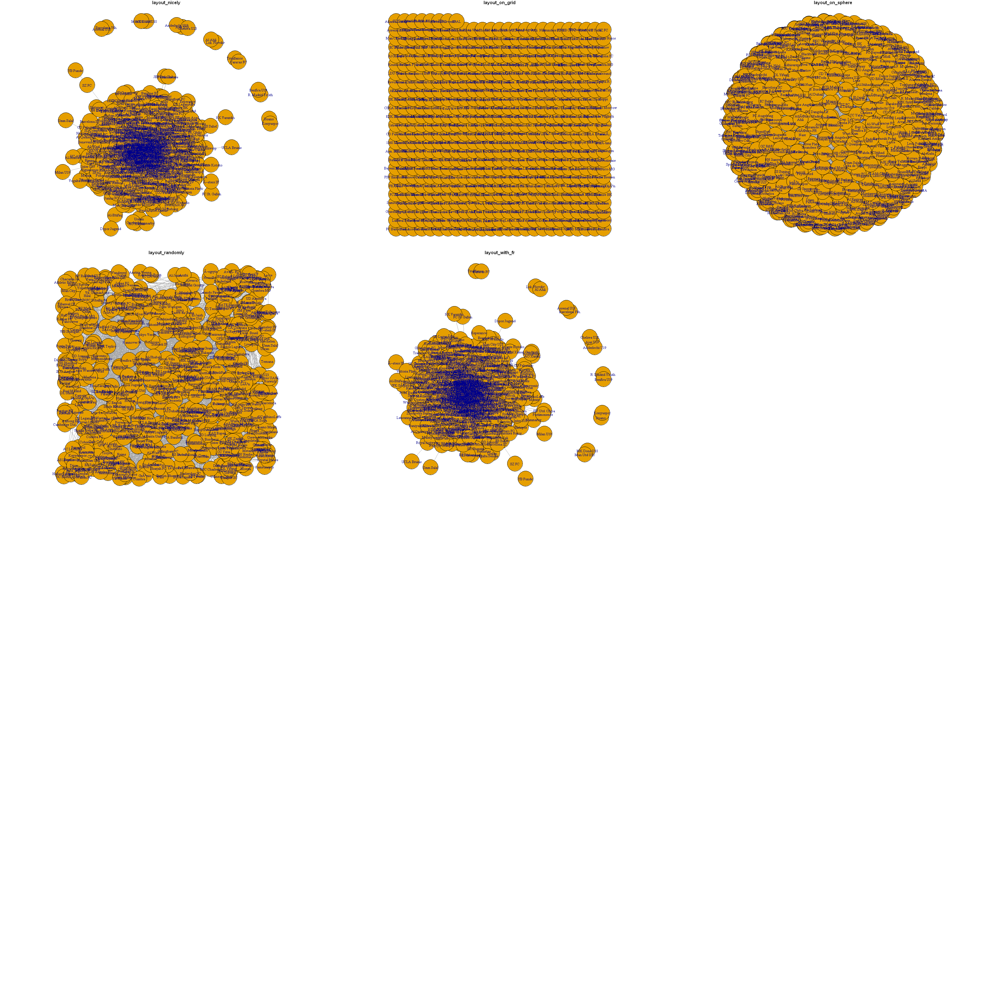

In [31]:
### Let find the best layout to illustrate the the network 

# this code obtains all layouts that are available specifically from iGraph package
layouts <- grep("^layout_", ls("package:igraph"), value=TRUE)[-1] 

# Remove layouts that are not appropriate here:
layouts <- layouts[!grepl("layout_with_dh|layout_components|bipartite|sugiyama|layout_as_tree|layout_with_kk|layout_as_star|layout_in_circle|layout_with_drl|layout_with_gem|layout_with_lgl|layout_with_mds|layout_with_graphopt", layouts)]

# this code snippet creates a plotting frame that presents layouts in a row of 3, with some margin space betwen each one
par(mfrow=c(4,3), mar=c(1,1,1,1))

for (layout in layouts) {

  print(layout) # uncomment this if you want to see the layout names more clearly
  l <- do.call(layout, list(nds_Tfr_gra1)) 
  plot(nds_Tfr_gra1, edge.arrow.mode=0, layout=l, main=layout)
}

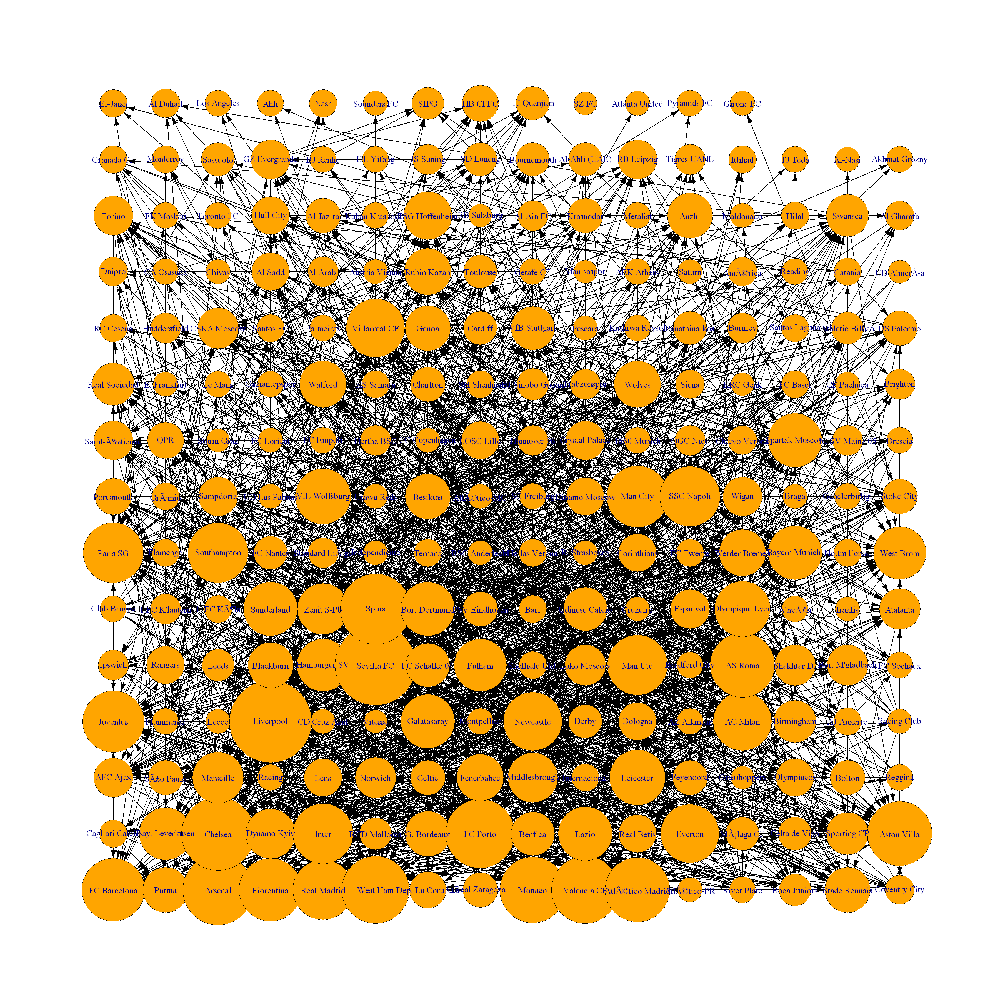

In [32]:
### Finally Here we illustrate the club with most transfers-in by node size and color
# Also because the grapgh is looking a bit rough lets also delete nodes less than mean degree

disconnected.nodes = which(degree(Tfr_gra1, mode = "in")< 2) # finds which nodes have degree < 2
nds_Tfr_gra1 <- delete.vertices(Tfr_gra1, disconnected.nodes) # removes the degree < 2 nodes

# Assiciate node size with degree
V(nds_Tfr_gra1)$size=6+15/diff(range(degree(nds_Tfr_gra1, mode = "in")))*degree(nds_Tfr_gra1, mode = "in")

options(repr.plot.width=30, repr.plot.height=30)
new_layout <- layout_on_grid(nds_Tfr_gra1)
plot(nds_Tfr_gra1, layout = new_layout, vertex.label.cex = 1.6, 
     edge.color = "black", vertex.color = "orange", edge.width = 2,edge.arrow.size = 0.2)

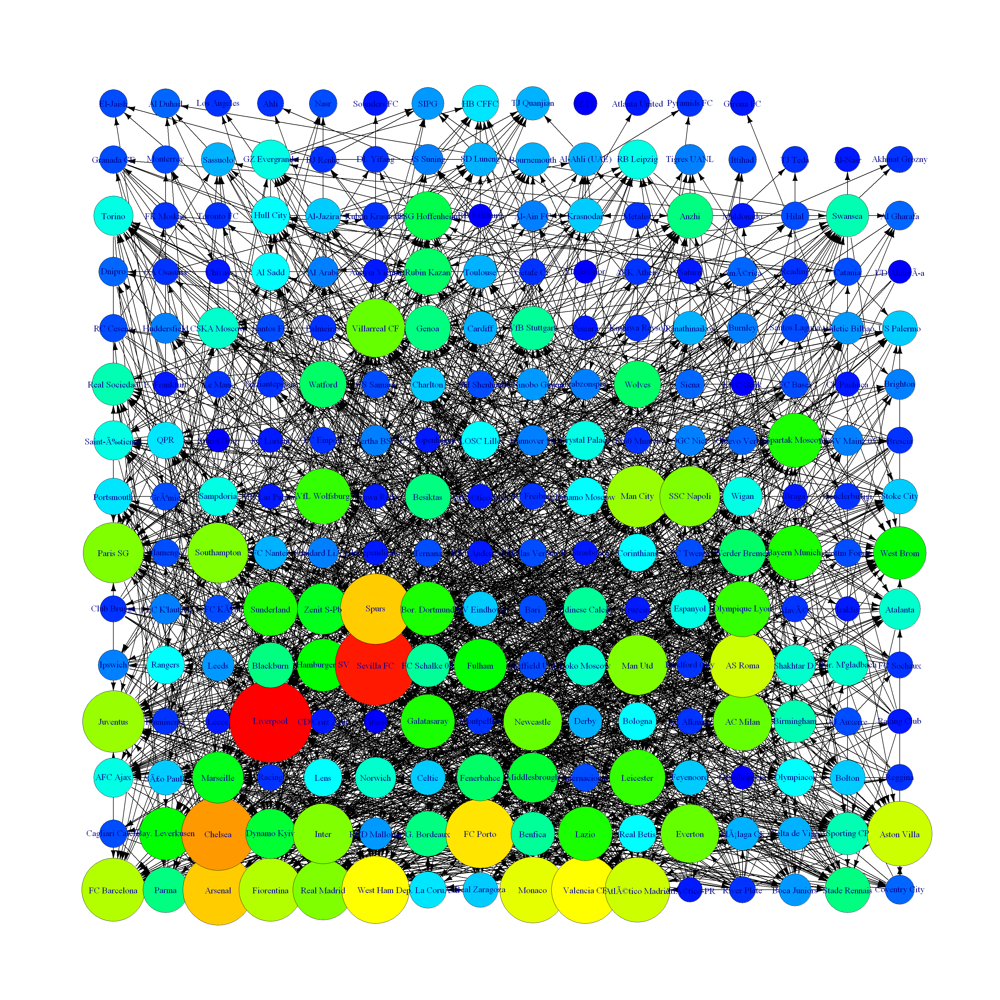

In [33]:
# Asssociate different colours with the degree:
#  end=2/3 stops the colours at dark blue instead of going to the end of the rainbow!; 
#  rev() reverses the order of the colours – so red represents the most connected vertex).
# rainbow color order Red-Orange-Yellow-Green-Blue

colors.new=rev(rainbow(max(degree(nds_Tfr_gra1, mode = "in"))+1,end=2/3))

V(nds_Tfr_gra1)$color=colors.new[degree(nds_Tfr_gra1, mode = "in")+1]


plot(nds_Tfr_gra1, layout = new_layout, vertex.label.cex = 1.6, 
     edge.color = "black", edge.width = 2,edge.arrow.size = 0.2)

###

### thus we can see from the network that livepool fc and Sevilla have the largest no of acquisions
### given only a single transaction existing with the selling club  

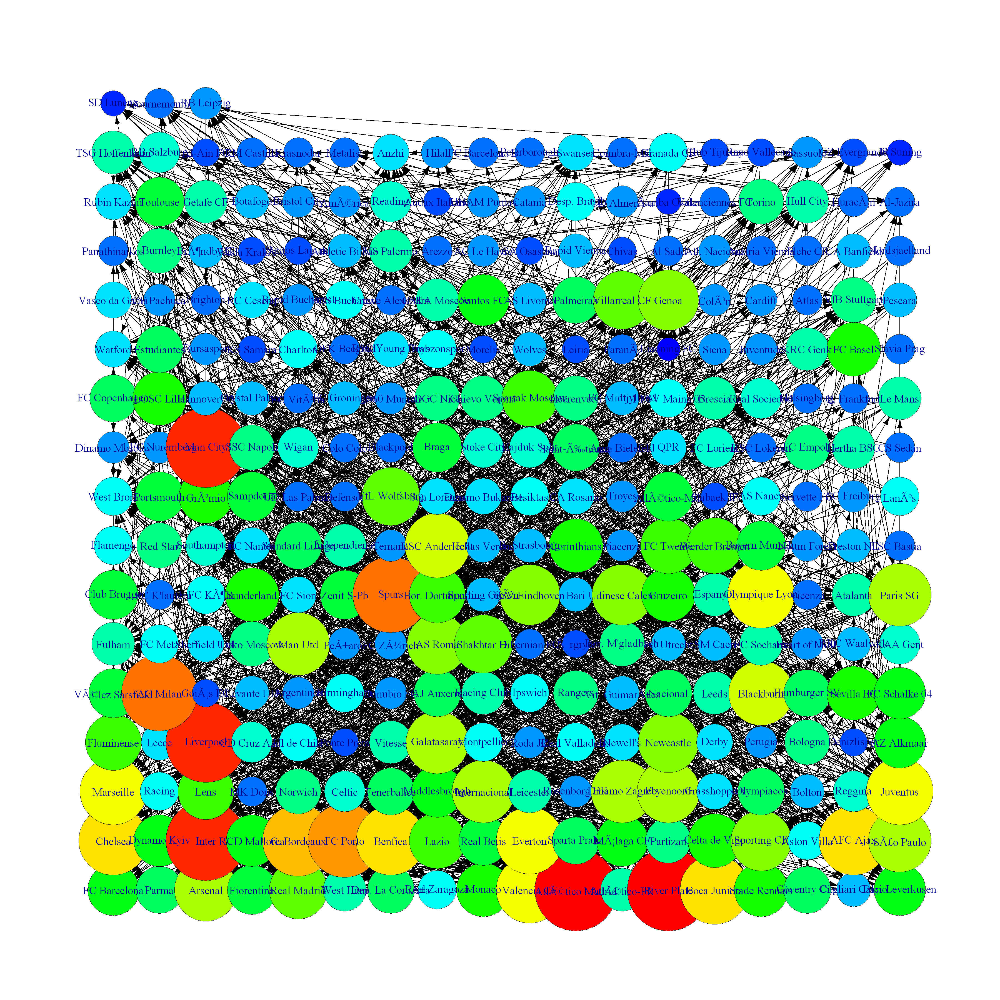

In [34]:
## plot for player sales when weight = 1 (for all transfer-from) 

disconnected.nodes = which(degree(Tfr_gra1, mode = "out") < 3) # finds which nodes have degree < half mean degree-out
nds_Tfr_gra1 <- delete.vertices(Tfr_gra1, disconnected.nodes) # Tunning the number above reduces the nodes but also reduces accuracy

# node Size
V(nds_Tfr_gra1)$size=6+15/diff(range(degree(nds_Tfr_gra1, mode = "out")))*degree(nds_Tfr_gra1, mode = "out") #mode args selects edge direction

# node color
colors.new=rev(rainbow(max(degree(nds_Tfr_gra1, mode = "out"))+1,end=2/3))
V(nds_Tfr_gra1)$color=colors.new[degree(nds_Tfr_gra1, mode = "out")+1]

# layout setting 
options(repr.plot.width=30, repr.plot.height=30)
new_layout <- layout_on_grid(nds_Tfr_gra1)

# plot
plot(nds_Tfr_gra1, layout = new_layout, vertex.label.cex = 2, 
     edge.color = "black", edge.width = 2,edge.arrow.size = 0.2)

In [35]:
mean(degree(Ftg, mode = "in"))
mean(degree(Ftg, mode = "out"))
mean(degree(Ftg, mode = "total"))

[1] 6.03252

[1] 6.03252

[1] 12.06504

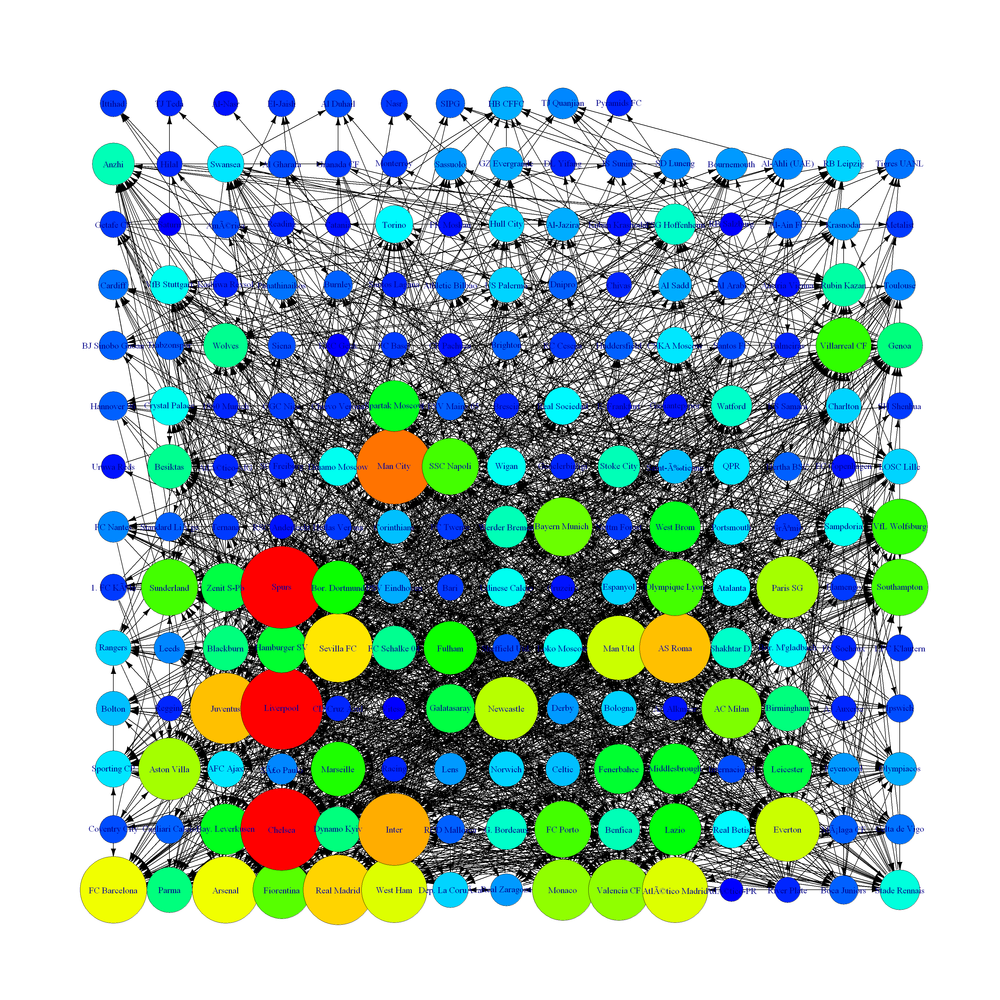

In [36]:
## plot using all weights for main gragh given (for all transfer-to) 

disconnected.nodes = which(degree(Ftg, mode = "in") < 3) # finds which nodes have degree < half mean degree in
nds_Ftg <- delete.vertices(Ftg, disconnected.nodes) # removes the degree < 3 nodes

# node Size
V(nds_Ftg)$size=6+15/diff(range(degree(nds_Ftg, mode = "in")))*degree(nds_Ftg, mode = "in") #mode args selects edge direction

# node color
colors.new=rev(rainbow(max(degree(nds_Ftg, mode = "in"))+1,end=2/3))
V(nds_Ftg)$color=colors.new[degree(nds_Ftg, mode = "in")+1]

# layout setting 
options(repr.plot.width=30, repr.plot.height=30)
new_layout <- layout_on_grid(nds_Ftg)

# plot
plot(nds_Ftg, layout = new_layout, vertex.label.cex = 1.6, 
     edge.color = "black", edge.width = 2,edge.arrow.size = 0.2)

<h4>Given the results above i've concluded there is no need to drill any futher into different weight values,
As the overall weight set will suffice provided that the nodes with degrees less than the average overall are deleted</h4>
 
 <p> We can also conclude from the network above that <b>[livepool fc, Chelsea fc, Spurs]</b> have the largest no of player acquisions
 in football from 2000-2018  </p>

<h2> (ii) Plot graph by node size and color thus indicating clubs with largest no transfers-OUT i.e total no of player sales </h2>

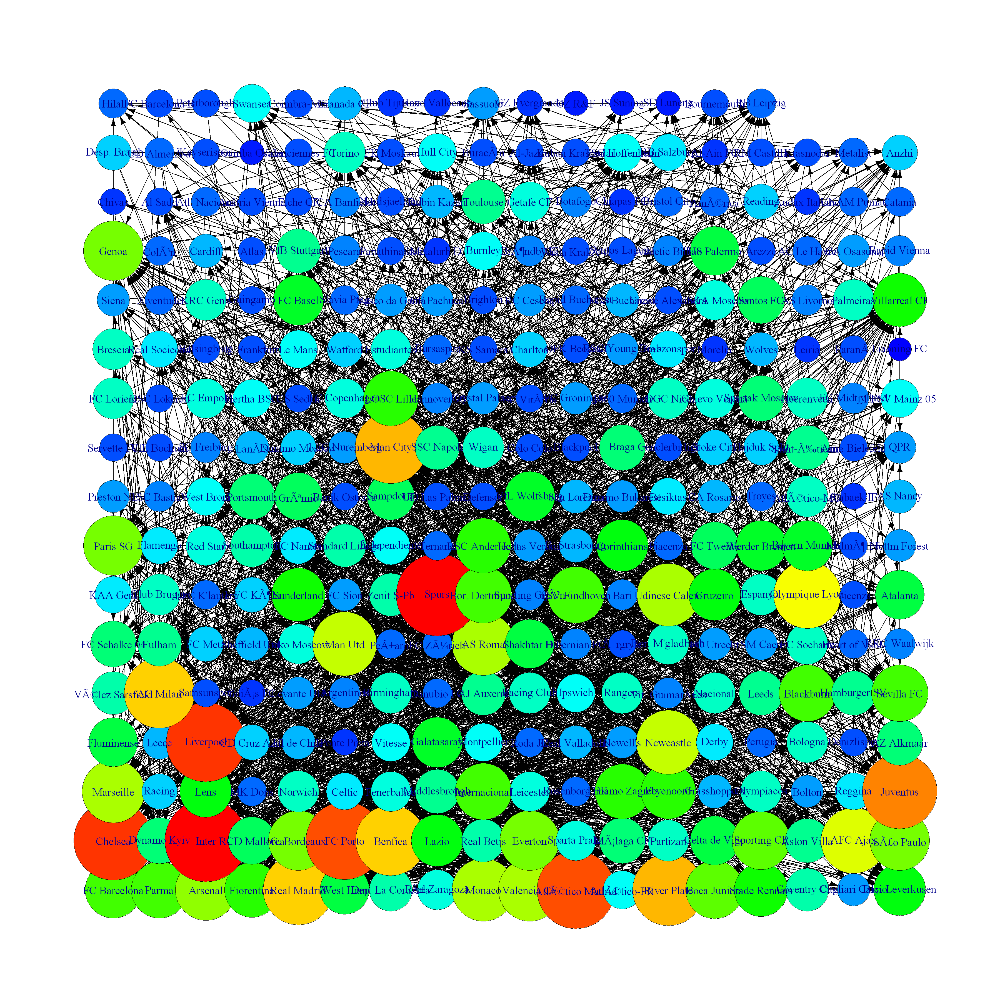

In [37]:
## plot using all weights for main gragh given (for all transfer-from) 

disconnected.nodes = which(degree(Ftg, mode = "out") < 3) # finds which nodes have degree < half mean degree-out
nds_Ftg <- delete.vertices(Ftg, disconnected.nodes) # Tunning the number above reduces the nodes but also reduces accuracy

# node Size
V(nds_Ftg)$size=6+15/diff(range(degree(nds_Ftg, mode = "out")))*degree(nds_Ftg, mode = "out") #mode args selects edge direction

# node color
colors.new=rev(rainbow(max(degree(nds_Ftg, mode = "out"))+1,end=2/3))
V(nds_Ftg)$color=colors.new[degree(nds_Ftg, mode = "out")+1]

# layout setting 
options(repr.plot.width=30, repr.plot.height=30)
new_layout <- layout_on_grid(nds_Ftg)

# plot
plot(nds_Ftg, layout = new_layout, vertex.label.cex = 2, 
     edge.color = "black", edge.width = 2,edge.arrow.size = 0.2)

 <p> We can also conclude from the network above that <b>[Inter, Chelsea fc, Spurs, Liverpool]</b> have the largest no of player sales
 in football from 2000-2018  </p>
 Notable clubs also include [Fc Porto, Athletico madrid]

# ...

# ...

<h2> (III) Plot graph by node size and color thus indicating clubs largest amount made from player sales from 2000-2018 </h2>

<p><b>S/N:</b> This plot is somewhat complicated so try it later after: use logic from this <a href:"https://stackoverflow.com/questions/51084048/sum-of-weights-following-vertices-attributes"> Stackexchange link </a> to generate two lists of (vertex attribute) showing total edge attibute sum of 'in' and 'out' of a given vertex </p>

In [38]:
# Logic::::
## transform igraph object in two data frames and remove NAs
#res_df <- igraph::as_data_frame(res, 'both')
#res_v <- res_df$vertices
#res_e <- res_df$edges
#res_v[is.na(res_v)] <- 0
#res_e[is.na(res_e)] <- 0
#
## generate two vectors listing ids of the nodes following critera 1 and criteria 2
#crit1_id <- res_v %>% filter(criteria == "value1") %>% .$name %>% as.numeric()
#crit2_id <- res_v %>% filter(criteria == "value2") %>% .$name %>% as.numeric()
#
## generate an edge list listing ties between any id from crit1_id to any id from crit2_id
#list_edge_1 <- res_e %>% filter(from %in% crit1_id & to %in% crit2_id)
#list_edge_2 <- res_e %>% filter(from %in% crit2_id & to %in% crit1_id)
#list_edge <- rbind(list_edge_1, list_edge_2)
#
## for each node in crit1_id, list direct edges to any node in crit2_id and store the weights in a vector, then add the sum of weights as a node attribute
#for (n in crit1_id) {
#   s <- list_edge %>% filter(from == n | to == n) %>% .$weight
#   res_v$new_attribute[res_v$name == n] <- sum(s)
#}
#
## make a new igraph object if you need
#new_res <- graph_from_data_frame(res_e,
#                         directed = F,
#                         vertices = res_v)#

In [39]:
#E(Ftg)[[]]
#E(Ftg)$total_t_fee
#V(Ftg)[[]]

<h2> (IV) Plot graph by node size and color thus indicating clubs largest amount Spent on player purchase</h2>

<p><b>use logic above!!!</b></p>

# ...

# ...

# Some other metric to calculate:
<p><ul>
<li>identify the nodes with greatest betweenness and closeness.</li>
<li>betweeness</li>
<li>clustering coeficient</li>
<li>clique</li>
<li>neigbors</li>
<li>average Path lenght</li>
<li>mean degree -> found</li>
<li>e.t.c</li>
  </ul></p>

In [40]:
largest_cliques(Ftg)
print(paste0("The size of the largest clique(s) is ",clique_num(Ftg)))

Warning message in largest_cliques(Ftg):
"At cliques.c:1125 :directionality of edges is ignored for directed graphs"


[[1]]
+ 12/615 vertices, named, from 7e2f7f0:
 [1] 75  19  213 161 1   5   58  11  21  24  55  98 

[[2]]
+ 12/615 vertices, named, from 7e2f7f0:
 [1] 75  19  213 10  1   5   11  58  21  24  55  98 

[[3]]
+ 12/615 vertices, named, from 7e2f7f0:
 [1] 55  19  58  161 21  5   1   9   24  213 11  98 

[[4]]
+ 12/615 vertices, named, from 7e2f7f0:
 [1] 55  19  58  24  5   9   21  213 10  1   11  98 

[[5]]
+ 12/615 vertices, named, from 7e2f7f0:
 [1] 55  19  58  3   5   21  1   9   213 10  11  98 


Warning message in clique_num(Ftg):
"At cliques.c:1125 :directionality of edges is ignored for directed graphs"


[1] "The size of the largest clique(s) is 12"


In [41]:
neighbors(Ftg, '1') 

+ 23/615 vertices, named, from 7e2f7f0:
 [1] 3   5   19  21  22  24  25  28  30  33  58  75  87  111 112 145 149 157 161
[20] 176 213 279 359

In [42]:
paste('average clustering coefficient (or transitivity) ',transitivity(Ftg))
paste('Average Path lenght',average.path.length(Ftg))
paste("Vertex Degree is",mean(degree(Ftg)))
paste('Density of graph',edge_density(Ftg, loops = FALSE))
paste("closeness centrality =",1/average.path.length(Ftg))
paste(sum(closeness(Ftg)))


[1] "average clustering coefficient (or transitivity)  0.21190247032403"

[1] "Average Path lenght 3.27408595463324"

[1] "Vertex Degree is 12.0650406504065"

[1] "Density of graph 0.00982495166971214"

[1] "closeness centrality = 0.305428755950917"

Warning message in closeness(Ftg):
"At centrality.c:2701 :closeness centrality is not well-defined for disconnected graphs"


[1] "0.00281228400891896"

# ...